# Installation

In [ ]:
!pip install git+https://github.com/borongzhang/magpie_ptychography.git@main

# Imports

In [1]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import imageio.v2 as imageio
import random
import time
from magpie_ptychography.src import magpie_loop, rpie, lbfgs
from magpie_ptychography.src import feasibility_distance_misfit
from magpie_ptychography.src import generate_intensity_measurements, generate_scanning_positions


# Setup

In [3]:
# Size of the object
object_shape = (512, 512)

# Side length of the probe
n_probe = 128


## Realistic Synthetic Object and Probe

In [4]:
mat_data = scipy.io.loadmat('assets/recon_zoneplate_Yi.mat')
obj = mat_data['obj']
orgn_probe = mat_data['probe']

pad_x = (object_shape[0] - obj.shape[0]) // 2
pad_y = (object_shape[1] - obj.shape[1]) // 2

# Pad the object to the desired shape
real_object = np.pad(obj, ((pad_x, pad_x), (pad_y, pad_y)), mode='edge')

ratio = orgn_probe.shape[0] // n_probe

real_probe = orgn_probe[::ratio,::ratio]

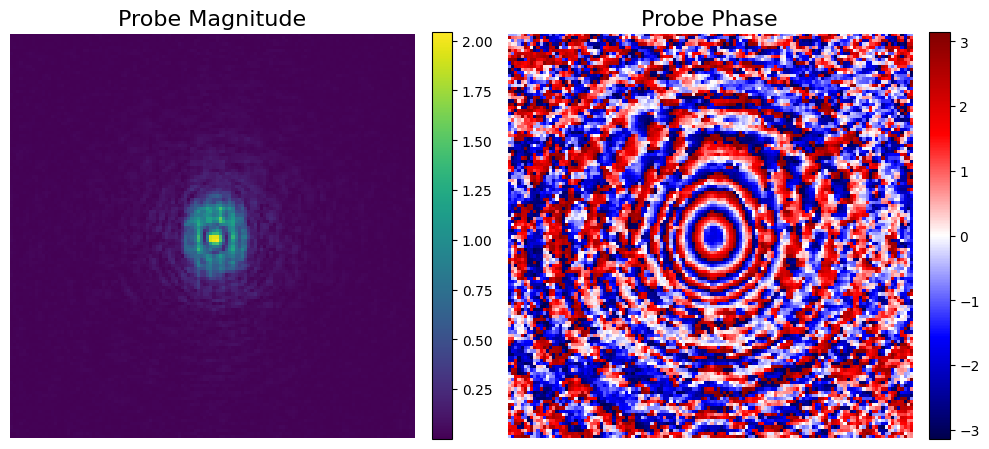

In [5]:
# Compute magnitude and phase
magnitude = np.abs(real_probe)
phase = np.angle(real_probe)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Probe Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='seismic')
ax.set_title('Probe Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('probe_mag_phase.png', dpi=120, bbox_inches='tight')
plt.show()

## Test Synthetic Object 

In [7]:
# Load the images
baboon_image = imageio.imread('assets/baboon.tiff')
# Convert the Baboon image to grayscale 
if baboon_image.ndim == 3:
    baboon_image = np.mean(baboon_image, axis=2)
    
cameraman_image = imageio.imread('assets/cameraman.tif')
if cameraman_image.ndim == 3:
    cameraman_image = np.mean(cameraman_image, axis=2)

# Normalize the Baboon image to [0, 1] for magnitude
baboon_magnitude = baboon_image / np.max(baboon_image)

# Normalize the Cameraman image to [0, pi/2] for phase
cameraman_phase = (cameraman_image / np.max(cameraman_image)) * (np.pi / 2)

synthetic_object = baboon_magnitude * np.exp(1j * cameraman_phase)


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3075504364.py:15: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  cameraman_phase = (cameraman_image / np.max(cameraman_image)) * (np.pi / 2)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3075504364.py:17: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  synthetic_object = baboon_magnitude * np.exp(1j * cameraman_phase)


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/1642947703.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude = np.abs(synthetic_object)


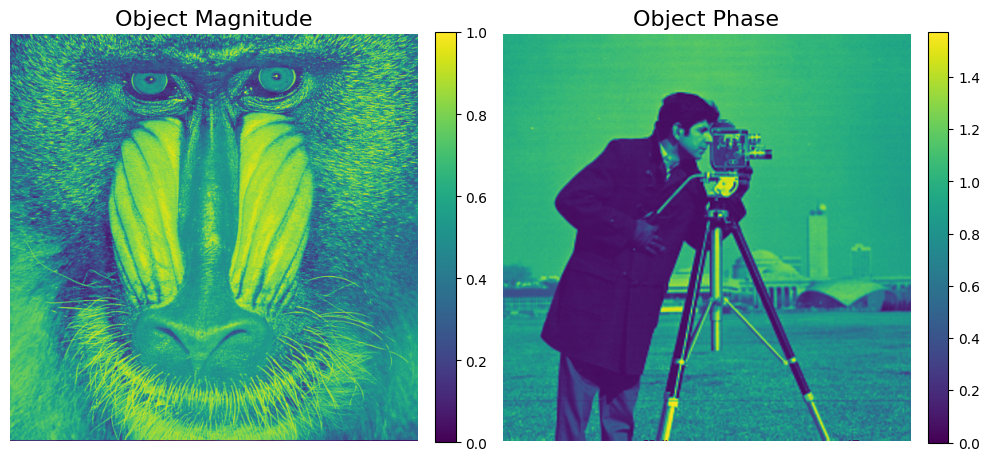

In [8]:
magnitude = np.abs(synthetic_object)
phase = np.angle(synthetic_object)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Object Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='viridis')
ax.set_title('Object Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('synthetic_object.png', dpi=120, bbox_inches='tight')
plt.show()


## Data Generation

In [10]:
# Choose Object
probe = real_probe
ground_truth = synthetic_object

# Probe shift for intensity measurement
shift_o25 = 96
shift_o75 = 32

# Define scanning positions
pos_array_o25 = generate_scanning_positions(object_shape, n_probe, shift_o25)
pos_array_o75 = generate_scanning_positions(object_shape, n_probe, shift_o75)

# Noise added to the measurement
noise_level = 0.05

# Generate the data
data_o25 = generate_intensity_measurements(ground_truth, probe, pos_array_o25, noise_level)
data_o75 = generate_intensity_measurements(ground_truth, probe, pos_array_o75, noise_level)


# Numerical examples

In [11]:
misfit = feasibility_distance_misfit
z_initial = np.ones_like(ground_truth)
num_iterations = 1000
alpha_rpie_o25 = 0.008
tol_o25 = 1e-5
alpha_rpie_o75 = 0.04
tol_o75 = 1e-4
print('The maximum level for MAGPIE is:', int(np.log2(probe.shape[0])))


The maximum level for MAGPIE is: 7


In [13]:
s = time.time()
z_recon_rPIE_o25, res_rPIE_o25, errors_rPIE_o25 = rpie(z_initial, probe, data_o25, pos_array_o25, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o25, metric = True, tol = tol_o25)
print(time.time()-s)


Iteration: 0, f: 777.9699624495499, g: 0.057054260572989804, error: 242.3473661616205
Iteration: 1, f: 34.51257586599607, g: 0.004603291237050338, error: 226.648663362738
Iteration: 2, f: 19.417874424363454, g: 0.0017032170479990688, error: 221.42986536065266
Iteration: 3, f: 15.083984743094046, g: 0.0009978723030889401, error: 217.63461583239973
Iteration: 4, f: 12.76018906679, g: 0.0007015962745001451, error: 214.47200051236652
Iteration: 5, f: 11.216572603242176, g: 0.0005465870916248628, error: 211.7005077398071
Iteration: 6, f: 10.07764910222357, g: 0.00045108696216941804, error: 209.2071021131294
Iteration: 7, f: 9.184781142919348, g: 0.0003859668980002352, error: 206.92748250279726
Iteration: 8, f: 8.456563725919558, g: 0.00033845762087683916, error: 204.8203084677354
Iteration: 9, f: 7.845862894417598, g: 0.00030211269931477785, error: 202.8570981656116
Iteration: 10, f: 7.3230173647450725, g: 0.00027338345875063463, error: 201.01687225506564
Iteration: 11, f: 6.868131172600843

Iteration: 92, f: 0.8673541703391026, g: 3.789256818953729e-05, error: 151.53445951755296
Iteration: 93, f: 0.8556682235903457, g: 3.75355549927874e-05, error: 151.31155159552802
Iteration: 94, f: 0.844249665695039, g: 3.718474568358968e-05, error: 151.0918646220017
Iteration: 95, f: 0.8330903330178167, g: 3.6843954360771094e-05, error: 150.8753686591357
Iteration: 96, f: 0.8221812353732123, g: 3.650981742588911e-05, error: 150.66200394111547
Iteration: 97, f: 0.8115147273871591, g: 3.6182001011626594e-05, error: 150.45168475928813
Iteration: 98, f: 0.8010841575835789, g: 3.585847915686827e-05, error: 150.2443555206042
Iteration: 99, f: 0.7908819026534789, g: 3.554765692775686e-05, error: 150.0399592539143
Iteration: 100, f: 0.7809016786116161, g: 3.5237399168961334e-05, error: 149.83842928690086
Iteration: 101, f: 0.771135928466396, g: 3.493576629552933e-05, error: 149.63969238260668
Iteration: 102, f: 0.7615796092323657, g: 3.464129360111381e-05, error: 149.44368668606072
Iteration: 

Iteration: 182, f: 0.362467097303039, g: 2.1315792552113163e-05, error: 139.4090346932155
Iteration: 183, f: 0.3599221361728846, g: 2.1220171651422734e-05, error: 139.32860640191225
Iteration: 184, f: 0.35740899620945527, g: 2.1127868220294954e-05, error: 139.24888688620905
Iteration: 185, f: 0.3549272382857151, g: 2.1033724150360187e-05, error: 139.16986932207521
Iteration: 186, f: 0.35247617086087124, g: 2.0942411342270542e-05, error: 139.0915494277508
Iteration: 187, f: 0.35005527924320184, g: 2.0851307303185493e-05, error: 139.01392269704598
Iteration: 188, f: 0.34766405737385914, g: 2.0761375144763967e-05, error: 138.93697260963737
Iteration: 189, f: 0.34530201404000027, g: 2.067256477867127e-05, error: 138.8606783520807
Iteration: 190, f: 0.34296869390807105, g: 2.058307317430858e-05, error: 138.78504309627664
Iteration: 191, f: 0.34066359453891176, g: 2.0494371871576705e-05, error: 138.71005094114798
Iteration: 192, f: 0.33838606148968764, g: 2.040940208257317e-05, error: 138.63

Iteration: 272, f: 0.216822634026435, g: 1.549416907884346e-05, error: 134.2339609620051
Iteration: 273, f: 0.21581386889676593, g: 1.545004979011433e-05, error: 134.19330593295643
Iteration: 274, f: 0.21481355485411133, g: 1.5406677755887777e-05, error: 134.1529134784111
Iteration: 275, f: 0.2138216365764802, g: 1.5362384653945394e-05, error: 134.11277894880755
Iteration: 276, f: 0.212838004407828, g: 1.531886747140247e-05, error: 134.07290264098123
Iteration: 277, f: 0.21186253670780458, g: 1.5276488489778393e-05, error: 134.03328258738085
Iteration: 278, f: 0.21089514589959607, g: 1.5233231158937792e-05, error: 133.99392522584643
Iteration: 279, f: 0.20993570773618492, g: 1.5192099407305752e-05, error: 133.9548192997412
Iteration: 280, f: 0.20898418442353936, g: 1.5150241438142596e-05, error: 133.91596549895308
Iteration: 281, f: 0.20804041483752916, g: 1.510744735956102e-05, error: 133.87735634493066
Iteration: 282, f: 0.20710436642877755, g: 1.506671026413374e-05, error: 133.83899

Iteration: 361, f: 0.151546053413668, g: 1.2483231502243391e-05, error: 131.43120392976135
Iteration: 362, f: 0.1510186124259333, g: 1.2456706998515952e-05, error: 131.40706078106712
Iteration: 363, f: 0.15049448220676487, g: 1.2430140256801302e-05, error: 131.38305240446687
Iteration: 364, f: 0.14997362784951213, g: 1.2405327989288175e-05, error: 131.35917501865148
Iteration: 365, f: 0.1494560319185615, g: 1.2379738141258321e-05, error: 131.33541878228732
Iteration: 366, f: 0.14894166164530245, g: 1.2354150876893336e-05, error: 131.31178619104944
Iteration: 367, f: 0.14843050449755857, g: 1.2328996433752176e-05, error: 131.28827809060832
Iteration: 368, f: 0.1479225133555112, g: 1.230411498647649e-05, error: 131.26489164165574
Iteration: 369, f: 0.14741765035637044, g: 1.2279257184789894e-05, error: 131.2416318711631
Iteration: 370, f: 0.1469159158274274, g: 1.2254388336689716e-05, error: 131.21848613195166
Iteration: 371, f: 0.14641726128146101, g: 1.222938810843558e-05, error: 131.1

Iteration: 450, f: 0.11485793184975149, g: 1.0590858611450288e-05, error: 129.69662718622675
Iteration: 451, f: 0.11453813477145662, g: 1.0573791057526872e-05, error: 129.68105651813892
Iteration: 452, f: 0.11421993139001874, g: 1.0556263897564095e-05, error: 129.66555228371206
Iteration: 453, f: 0.1139033195220531, g: 1.0538834869274646e-05, error: 129.65011988016843
Iteration: 454, f: 0.1135882846962554, g: 1.052204289144582e-05, error: 129.6347624075477
Iteration: 455, f: 0.11327481087440394, g: 1.0504704921169174e-05, error: 129.61947591904632
Iteration: 456, f: 0.11296290344665538, g: 1.0487566049314017e-05, error: 129.60425420789667
Iteration: 457, f: 0.11265253807498797, g: 1.0470833128686428e-05, error: 129.58909945292024
Iteration: 458, f: 0.11234369096245322, g: 1.045392413132687e-05, error: 129.5740216645553
Iteration: 459, f: 0.11203636385042416, g: 1.043699030648549e-05, error: 129.55900994418448
Iteration: 460, f: 0.11173054140883003, g: 1.0420924956533067e-05, error: 129

In [14]:
s = time.time()
z_recon_rPIE_o75, res_rPIE_o75, errors_rPIE_o75 = rpie(z_initial, probe, data_o75, pos_array_o75, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o75, metric = True, tol = tol_o75)
print(time.time()-s)

Iteration: 0, f: 5463.9724419463855, g: 0.05858761283885994, error: 242.3473661616205
Iteration: 1, f: 444.0217285976775, g: 0.009509169518331416, error: 191.52201320552092
Iteration: 2, f: 168.25636461231832, g: 0.0035003647035764364, error: 179.45916846905118
Iteration: 3, f: 109.02577969652671, g: 0.002003429051634828, error: 172.91545262457856
Iteration: 4, f: 83.97013058768172, g: 0.0013981692295546243, error: 168.25717917378816
Iteration: 5, f: 69.66558779737231, g: 0.001099788326125677, error: 164.57550743015085
Iteration: 6, f: 60.13195307992074, g: 0.000927094359610043, error: 161.49959348497487
Iteration: 7, f: 53.184254692437435, g: 0.0008148403196412966, error: 158.84319387274238
Iteration: 8, f: 47.83570854856532, g: 0.0007356019109238869, error: 156.49631102658194
Iteration: 9, f: 43.55854066293574, g: 0.0006754487330327941, error: 154.38989231533682
Iteration: 10, f: 40.044144982620594, g: 0.0006284612039828649, error: 152.4737788275943
Iteration: 11, f: 37.0921544836631

Iteration: 92, f: 5.73431840514559, g: 0.00016164476482227323, error: 104.71544342139948
Iteration: 93, f: 5.680618739726034, g: 0.00016069842262691236, error: 104.44579377854234
Iteration: 94, f: 5.628029874156001, g: 0.00015982485022767075, error: 104.17847154112097
Iteration: 95, f: 5.576028975417108, g: 0.00015850140045368534, error: 103.91327323212363
Iteration: 96, f: 5.526191529483434, g: 0.00015855849249265372, error: 103.65048918509828
Iteration: 97, f: 5.476653880594382, g: 0.00015717508990291764, error: 103.39049163709633
Iteration: 98, f: 5.428280969312304, g: 0.0001557302743325545, error: 103.13251875326522
Iteration: 99, f: 5.381483024150254, g: 0.00015558359059742997, error: 102.87654247149725
Iteration: 100, f: 5.33571355050824, g: 0.00015446192928846044, error: 102.62283242447029
Iteration: 101, f: 5.290783327747628, g: 0.00015392027694528592, error: 102.37165002621464
Iteration: 102, f: 5.247231475062089, g: 0.0001539260563613256, error: 102.12219957267047
Iteration: 

Iteration: 184, f: 3.2796516584580395, g: 0.00012000193912163165, error: 86.5565911263301
Iteration: 185, f: 3.265513129609464, g: 0.0001195564410976872, error: 86.40833660557375
Iteration: 186, f: 3.251714384843898, g: 0.00011952265662880116, error: 86.26058095648708
Iteration: 187, f: 3.237855757844663, g: 0.00011933605340670356, error: 86.11361514261652
Iteration: 188, f: 3.223809617050512, g: 0.00011903421779597884, error: 85.96747419954322
Iteration: 189, f: 3.210029603757008, g: 0.00011864476281123379, error: 85.82195271837016
Iteration: 190, f: 3.1962365483377133, g: 0.0001183886710896693, error: 85.67671841042582
Iteration: 191, f: 3.1824876596850014, g: 0.00011842585128403735, error: 85.53282774172696
Iteration: 192, f: 3.168900518658299, g: 0.00011824003097206914, error: 85.38939464329043
Iteration: 193, f: 3.155119418947067, g: 0.00011750016060866521, error: 85.2463439945384
Iteration: 194, f: 3.141614549728639, g: 0.00011764997747637291, error: 85.104248401437
Iteration: 19

Iteration: 275, f: 2.3881139354558587, g: 0.00010225060965146819, error: 75.4349891333513
Iteration: 276, f: 2.3820968472853945, g: 0.00010178669666560088, error: 75.33419447251897
Iteration: 277, f: 2.3762359938487485, g: 0.00010183342457379711, error: 75.23418438164805
Iteration: 278, f: 2.370279148801444, g: 0.00010108026835907048, error: 75.13424758857917
Iteration: 279, f: 2.3645924086418937, g: 0.00010114554622983409, error: 75.03484716490414
Iteration: 280, f: 2.358843579711505, g: 0.00010109976525881816, error: 74.93577870813687
Iteration: 281, f: 2.353234632002145, g: 0.00010125053980537447, error: 74.83699160621532
Iteration: 282, f: 2.3475766814800534, g: 0.00010114710017249409, error: 74.73857282504338
Iteration: 283, f: 2.342007813482703, g: 0.00010157606054420179, error: 74.64070618139868
Iteration: 284, f: 2.336257672480009, g: 0.00010058319857112094, error: 74.54274014257953
Iteration: 285, f: 2.3306284163214626, g: 0.00010042343388232571, error: 74.44541704279324
Itera

In [15]:
s = time.time()
z_recon_MAGPIE_o25, res_MAGPIE_o25, errors_MAGPIE_o25 = magpie_loop(z_initial, probe, data_o25, pos_array_o25, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o25, metric = True, tol = tol_o25, 
                                                   max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)


Iteration: 0, f: 777.9699624495499, g: 0.057054260572989804, error: 242.3473661616205
Iteration: 1, f: 12.623350264393224, g: 0.0022306143492407293, error: 179.04843170735447
Iteration: 2, f: 7.574322743756211, g: 0.0010041527499502537, error: 162.4453891752226
Iteration: 3, f: 5.510429665574335, g: 0.0006179731440777836, error: 150.09840033098465
Iteration: 4, f: 4.306702660246075, g: 0.00043988320097438434, error: 140.26224429683558
Iteration: 5, f: 3.50721167333463, g: 0.0003408579123212365, error: 132.20835628121657
Iteration: 6, f: 2.9392272517773534, g: 0.0002782898351603074, error: 125.50253565458911
Iteration: 7, f: 2.5178492971865833, g: 0.00023519672448113203, error: 119.84507528436897
Iteration: 8, f: 2.1948291819562917, g: 0.0002039066134639522, error: 115.01176116524117
Iteration: 9, f: 1.941185708171104, g: 0.00018000833640657282, error: 110.84885719650637
Iteration: 10, f: 1.737501315755445, g: 0.00016147426332465193, error: 107.22332133027882
Iteration: 11, f: 1.5712071

Iteration: 92, f: 0.19241464658404867, g: 2.161075846358763e-05, error: 62.540627552698595
Iteration: 93, f: 0.19051825254965146, g: 2.143062152772398e-05, error: 62.45489773136071
Iteration: 94, f: 0.18866357868046466, g: 2.1252401968401814e-05, error: 62.37117223638283
Iteration: 95, f: 0.18684684395353096, g: 2.1072817818510454e-05, error: 62.289308772410685
Iteration: 96, f: 0.18506726442784144, g: 2.092771126917451e-05, error: 62.20934690218353
Iteration: 97, f: 0.18332170866252148, g: 2.0748487953021144e-05, error: 62.131162152340956
Iteration: 98, f: 0.18161296901918458, g: 2.060416336165908e-05, error: 62.05464101056505
Iteration: 99, f: 0.17993727638623158, g: 2.0457042003565886e-05, error: 61.979881378928525
Iteration: 100, f: 0.17829313320379978, g: 2.0291275576557175e-05, error: 61.906801020516355
Iteration: 101, f: 0.17667896198415414, g: 2.015846109662209e-05, error: 61.835312479963946
Iteration: 102, f: 0.1750981629674906, g: 2.0002110508145758e-05, error: 61.76536374816

Iteration: 182, f: 0.10355739579498564, g: 1.324469278911551e-05, error: 59.035140703474674
Iteration: 183, f: 0.1030430424444083, g: 1.3197709164030279e-05, error: 59.021400468687965
Iteration: 184, f: 0.10253492537679204, g: 1.3141111728250468e-05, error: 59.00788526477019
Iteration: 185, f: 0.10203253967500082, g: 1.3088469890432896e-05, error: 58.99461863292845
Iteration: 186, f: 0.10153414524813381, g: 1.3032732170234473e-05, error: 58.98163595534877
Iteration: 187, f: 0.10104186391889201, g: 1.2987881148328196e-05, error: 58.96903999397226
Iteration: 188, f: 0.10055356542415082, g: 1.2938648115433164e-05, error: 58.956625952401765
Iteration: 189, f: 0.10007078854169169, g: 1.2891622526024078e-05, error: 58.94444348320951
Iteration: 190, f: 0.09959226748381873, g: 1.2845151953721122e-05, error: 58.93260359849344
Iteration: 191, f: 0.09911956817883764, g: 1.2798239897269359e-05, error: 58.92094107891405
Iteration: 192, f: 0.09865081873286274, g: 1.2746880563525889e-05, error: 58.90

Iteration: 272, f: 0.07178620472563664, g: 1.0059923596768104e-05, error: 58.554172363350105
Iteration: 273, f: 0.07154453577266272, g: 1.0040132582745686e-05, error: 58.55445979843807
Iteration: 274, f: 0.07130429430464316, g: 1.0018601397130175e-05, error: 58.55484324848451
Iteration: 275, f: 0.07106540811217334, g: 9.983431781903532e-06, error: 58.55526964053114
64.66685318946838


In [16]:
s = time.time()
z_recon_MAGPIE_o75, res_MAGPIE_o75, errors_MAGPIE_o75 = magpie_loop(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o75, metric = True, tol = tol_o75, 
                                                   max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)


Iteration: 0, f: 5463.9724419463855, g: 0.05858761283885994, error: 242.3473661616205
Iteration: 1, f: 136.02137828505036, g: 0.00642308664470386, error: 138.9948295444236
Iteration: 2, f: 46.80518160579499, g: 0.0018811544169063824, error: 132.11995355917995
Iteration: 3, f: 33.121229131553186, g: 0.001277526732410465, error: 126.7982939581667
Iteration: 4, f: 25.963709245706564, g: 0.0009742386917903266, error: 122.4506802299964
Iteration: 5, f: 21.543367494374277, g: 0.0008281593439690157, error: 118.67312093474342
Iteration: 6, f: 18.42948924504763, g: 0.0007342227848376809, error: 115.28724492140367
Iteration: 7, f: 16.06930730180125, g: 0.0006420299844507333, error: 112.22452038286919
Iteration: 8, f: 14.253313904525902, g: 0.0005797418662417545, error: 109.40476314749301
Iteration: 9, f: 12.830419536811345, g: 0.0005438261139903617, error: 106.79398401584726
Iteration: 10, f: 11.618593514647726, g: 0.0004867293385206261, error: 104.36088416663246
Iteration: 11, f: 10.64680139627

Iteration: 92, f: 1.7881304570062904, g: 0.0001230361361129795, error: 43.84710798948332
Iteration: 93, f: 1.7776549669066062, g: 0.00012318853496259933, error: 43.61561342266674
Iteration: 94, f: 1.7679343240560632, g: 0.00012339243367496982, error: 43.387652084559576
Iteration: 95, f: 1.7571503753214601, g: 0.00012052531680284791, error: 43.162676885545714
Iteration: 96, f: 1.747619775515598, g: 0.0001207196653000677, error: 42.940939643414616
Iteration: 97, f: 1.7382366259805195, g: 0.0001200402404287223, error: 42.72362599369994
Iteration: 98, f: 1.729029092031505, g: 0.00011990232368399614, error: 42.509097118218726
Iteration: 99, f: 1.720109569831386, g: 0.0001190047016674981, error: 42.298355327194976
Iteration: 100, f: 1.7118419468956225, g: 0.00011917739982751215, error: 42.09136398912898
Iteration: 101, f: 1.7039021126904705, g: 0.00011932338028884732, error: 41.88795374991675
Iteration: 102, f: 1.6961465170577725, g: 0.00011924215337836847, error: 41.68810543133232
Iteration

Iteration: 183, f: 1.4027308999816837, g: 0.00010363114330223667, error: 31.66313814827886
Iteration: 184, f: 1.4008782276051042, g: 0.00010341128219718348, error: 31.584390262494715
Iteration: 185, f: 1.399090722100262, g: 0.0001025040336830978, error: 31.506259695715663
Iteration: 186, f: 1.3973070476647595, g: 0.00010289876049315439, error: 31.42894241192849
Iteration: 187, f: 1.3953359477321745, g: 0.00010256463103625824, error: 31.352306577633502
Iteration: 188, f: 1.39313621647483, g: 0.00010304217221109096, error: 31.27639267873474
Iteration: 189, f: 1.3895504509254337, g: 0.00010294840838406902, error: 31.2000804699505
Iteration: 190, f: 1.3855036904775357, g: 0.00010230240846706732, error: 31.124147273857066
Iteration: 191, f: 1.3820183951612215, g: 0.00010333188993458027, error: 31.049846632259058
Iteration: 192, f: 1.3789331867793178, g: 0.0001024280653352192, error: 30.974975178038722
Iteration: 193, f: 1.3762711371874305, g: 0.00010271944674309977, error: 30.90177496496628

In [17]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_o25, error_f_LBFGS_o25, eval_history_LBFGS_o25 = lbfgs(z_initial, probe, data_o25, pos_array_o25, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o25)
print(time.time()-s)

Iter 1, f = 363.2941928066465, g = 0.04316797248471767, Func Evals = 2, Error = 238.62336006169878
Iter 2, f = 136.85823289412556, g = 0.01532634607618205, Func Evals = 3, Error = 237.81849149252716
Iter 3, f = 89.10675713632497, g = 0.008642811559574396, Func Evals = 4, Error = 237.17384169871102
Iter 4, f = 65.63656879023806, g = 0.00663901249766054, Func Evals = 5, Error = 236.405856505274
Iter 5, f = 49.15103179794909, g = 0.005697306091526014, Func Evals = 6, Error = 235.21893261002248
Iter 6, f = 41.94448292249357, g = 0.004407759314261088, Func Evals = 7, Error = 234.40367565173406
Iter 7, f = 38.07354503539277, g = 0.0028429252879171294, Func Evals = 8, Error = 234.05881744849987
Iter 8, f = 33.135892647934774, g = 0.0025481657022506394, Func Evals = 9, Error = 233.03233506090666
Iter 9, f = 30.07405000084757, g = 0.003066810403340384, Func Evals = 10, Error = 232.03130659953413
Iter 10, f = 27.105361450706916, g = 0.002061365932842588, Func Evals = 11, Error = 231.064132332800

Iter 82, f = 1.8616383069889606, g = 0.00031007361971916873, Func Evals = 83, Error = 166.97971785878966
Iter 83, f = 1.8276275170384906, g = 0.0006231007238233384, Func Evals = 84, Error = 165.78410744599094
Iter 84, f = 1.7670849807292597, g = 0.00024150159620734186, Func Evals = 85, Error = 165.8368238000533
Iter 85, f = 1.7441847326546858, g = 0.00020284595621159162, Func Evals = 86, Error = 165.58834765445675
Iter 86, f = 1.676865477319968, g = 0.0002283067772525373, Func Evals = 87, Error = 164.57177402686878
Iter 87, f = 1.654894322685562, g = 0.0006086070383936384, Func Evals = 88, Error = 164.02890864071367
Iter 88, f = 1.6075867720988053, g = 0.0002655619019960616, Func Evals = 89, Error = 163.83730669476944
Iter 89, f = 1.5852352696607215, g = 0.0002113268174653366, Func Evals = 90, Error = 163.73767497866675
Iter 90, f = 1.5514327781928294, g = 0.00018851311541807724, Func Evals = 91, Error = 163.38197137538532
Iter 91, f = 1.5043266414133813, g = 0.00038808972389530984, Fu

Iter 160, f = 0.4598824690426575, g = 0.00019666619403029397, Func Evals = 162, Error = 145.3501532122501
Iter 161, f = 0.4524726212580769, g = 0.00010425047717386817, Func Evals = 163, Error = 145.2594253042176
Iter 162, f = 0.4477628022954214, g = 8.740289135733538e-05, Func Evals = 164, Error = 145.17758466745664
Iter 163, f = 0.44215350671319037, g = 9.572398540197415e-05, Func Evals = 165, Error = 145.10037866271938
Iter 164, f = 0.435786755319826, g = 0.00018132247291013982, Func Evals = 166, Error = 144.93098367317268
Iter 165, f = 0.42847629461014264, g = 8.721401176256389e-05, Func Evals = 167, Error = 144.88095705013058
Iter 166, f = 0.4247638730279761, g = 8.875722113764534e-05, Func Evals = 168, Error = 144.80837477749088
Iter 167, f = 0.4179188527504677, g = 0.00012196783933513897, Func Evals = 169, Error = 144.6324827445722
Iter 168, f = 0.4133038283352484, g = 0.00017145569195614274, Func Evals = 170, Error = 144.39863020930585
Iter 169, f = 0.40594527094896365, g = 8.45

Iter 238, f = 0.19709433306806884, g = 4.9856759918764333e-05, Func Evals = 242, Error = 140.15789390222298
Iter 239, f = 0.19611856369560968, g = 3.928081344269957e-05, Func Evals = 243, Error = 140.14926450485234
Iter 240, f = 0.19356713287490862, g = 4.579421685962569e-05, Func Evals = 244, Error = 140.09163017732544
Iter 241, f = 0.19119620872169976, g = 7.698864305741656e-05, Func Evals = 245, Error = 140.02775108526643
Iter 242, f = 0.18949605572509037, g = 7.439850221097086e-05, Func Evals = 246, Error = 139.9520731609938
Iter 243, f = 0.18810885848497635, g = 5.060653694353747e-05, Func Evals = 247, Error = 139.94881714233736
Iter 244, f = 0.18616193156908117, g = 4.596077909110847e-05, Func Evals = 248, Error = 139.91783685905375
Iter 245, f = 0.18399151387851653, g = 4.7607123482384426e-05, Func Evals = 249, Error = 139.84996924906616
Iter 246, f = 0.18187311727528493, g = 8.066757330382476e-05, Func Evals = 250, Error = 139.76581068912608
Iter 247, f = 0.17979768202651655, g

Iter 315, f = 0.10607604808966219, g = 3.752039431506488e-05, Func Evals = 320, Error = 138.09177165813156
Iter 316, f = 0.10497947168621363, g = 3.372322659402108e-05, Func Evals = 321, Error = 138.076594222538
Iter 317, f = 0.10434684101090175, g = 5.9235913615929524e-05, Func Evals = 322, Error = 138.0678089489412
Iter 318, f = 0.10350987163692513, g = 3.4770061430131334e-05, Func Evals = 323, Error = 138.06113820946698
Iter 319, f = 0.10272950338710836, g = 3.2816969194389585e-05, Func Evals = 324, Error = 138.0558181541071
Iter 320, f = 0.10147060388457477, g = 3.569721269217926e-05, Func Evals = 325, Error = 138.04157279646003
Iter 321, f = 0.10093069269704572, g = 5.884498172267568e-05, Func Evals = 326, Error = 138.02822737775907
Iter 322, f = 0.10021623719100105, g = 3.2756402698678104e-05, Func Evals = 327, Error = 138.02540378601216
Iter 323, f = 0.09972658552012631, g = 3.2522049346145345e-05, Func Evals = 328, Error = 138.0206584688872
Iter 324, f = 0.09911270131160928, g 

Iter 392, f = 0.06176703964711737, g = 2.5024817131490682e-05, Func Evals = 397, Error = 137.66101084619115
Iter 393, f = 0.061369131637884516, g = 3.808740555329699e-05, Func Evals = 398, Error = 137.65922737382508
Iter 394, f = 0.06083824293878812, g = 2.2724611750861314e-05, Func Evals = 399, Error = 137.65890297665288
Iter 395, f = 0.06043235737071827, g = 2.0201318336428993e-05, Func Evals = 400, Error = 137.6589988247725
Iter 396, f = 0.0599987878301339, g = 3.228550556120345e-05, Func Evals = 401, Error = 137.66228496879532
Iter 397, f = 0.05975260745616461, g = 2.969136338342886e-05, Func Evals = 402, Error = 137.6641291905447
Iter 398, f = 0.0595360870214348, g = 1.7452140559379608e-05, Func Evals = 403, Error = 137.66323250544372
Iter 399, f = 0.059309441033784396, g = 1.563849679915627e-05, Func Evals = 404, Error = 137.66233163103544
Iter 400, f = 0.058895795210819925, g = 2.2108890820280987e-05, Func Evals = 405, Error = 137.66186018023515
Iter 401, f = 0.05861810214949058

Iter 469, f = 0.04292058814994183, g = 1.3296166432259712e-05, Func Evals = 479, Error = 137.49553348331173
Iter 470, f = 0.042715044086126294, g = 1.9259529798800303e-05, Func Evals = 480, Error = 137.493893612147
Iter 471, f = 0.04255305788731963, g = 1.9235756192700473e-05, Func Evals = 481, Error = 137.49212971821666
Iter 472, f = 0.042442558225910414, g = 1.579554881158612e-05, Func Evals = 482, Error = 137.4919063602552
Iter 473, f = 0.042264762865616146, g = 1.7691699166084705e-05, Func Evals = 483, Error = 137.49112708961798
Iter 474, f = 0.04205880772308647, g = 1.6320764995047313e-05, Func Evals = 484, Error = 137.48998741871662
Iter 475, f = 0.0419555047138712, g = 2.7122937751875916e-05, Func Evals = 485, Error = 137.4887020958677
Iter 476, f = 0.04177945519790256, g = 1.655870152004698e-05, Func Evals = 486, Error = 137.4885819418131
Iter 477, f = 0.04169726294342288, g = 1.4345214099115871e-05, Func Evals = 487, Error = 137.48838505077802
Iter 478, f = 0.04153065872691445

Iter 546, f = 0.030845232320322435, g = 1.7017131810622153e-05, Func Evals = 560, Error = 137.66273492432458
Iter 547, f = 0.030738892800744783, g = 1.4390408781205659e-05, Func Evals = 561, Error = 137.6657118326652
Iter 548, f = 0.030603178671533435, g = 1.459547358047985e-05, Func Evals = 562, Error = 137.66786340456233
Iter 549, f = 0.03048774553053576, g = 3.173984979096197e-05, Func Evals = 563, Error = 137.67350531930958
Iter 550, f = 0.030321535149409364, g = 1.3154990906274924e-05, Func Evals = 564, Error = 137.67391542608672
Iter 551, f = 0.030258401615888043, g = 1.3771594764168672e-05, Func Evals = 565, Error = 137.67544301603525
Iter 552, f = 0.03008938324065127, g = 1.7736963511382313e-05, Func Evals = 566, Error = 137.68183895978808
Iter 553, f = 0.02987807999024624, g = 2.660338414527308e-05, Func Evals = 567, Error = 137.69389130173843
Iter 554, f = 0.02966455900015529, g = 2.1430902989230244e-05, Func Evals = 568, Error = 137.703212512372
Iter 555, f = 0.0295559342688

Iter 622, f = 0.021301986480118475, g = 2.2829731345896127e-05, Func Evals = 639, Error = 138.45068002818203
Iter 623, f = 0.021234510272864358, g = 1.0876465488899768e-05, Func Evals = 640, Error = 138.44441309410072
Iter 624, f = 0.021195514269664584, g = 9.559239038668125e-06, Func Evals = 641, Error = 138.4447386364973
Iter 625, f = 0.021053766815405148, g = 1.032599799393445e-05, Func Evals = 642, Error = 138.44817442722444
Iter 626, f = 0.021048527733353292, g = 2.397125507963716e-05, Func Evals = 644, Error = 138.44703731652285
Iter 627, f = 0.020958767410956588, g = 9.483798174921746e-06, Func Evals = 645, Error = 138.4475853632218
Iter 628, f = 0.020933200737306524, g = 8.572882348543466e-06, Func Evals = 646, Error = 138.44893788102277
Iter 629, f = 0.020849623441018206, g = 7.605764952650128e-06, Func Evals = 647, Error = 138.45332500707698
Iter 630, f = 0.020834705910099824, g = 3.419166010771604e-05, Func Evals = 648, Error = 138.47182063942893
Iter 631, f = 0.020671177514

In [18]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_o75, error_f_LBFGS_o75, eval_history_LBFGS_o75 = lbfgs(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o75)
print(time.time()-s)

Iter 1, f = 2486.9731554832897, g = 0.04418654858241957, Func Evals = 2, Error = 215.8295761795311
Iter 2, f = 868.2248278120134, g = 0.015750693343012885, Func Evals = 3, Error = 210.09027446425767
Iter 3, f = 531.7349504979184, g = 0.008633764237928812, Func Evals = 4, Error = 205.93866244030875
Iter 4, f = 367.45261879504915, g = 0.006602202707666919, Func Evals = 5, Error = 201.17964735866207
Iter 5, f = 250.7193282161528, g = 0.005440851994802225, Func Evals = 6, Error = 194.28455751589556
Iter 6, f = 205.07994557230154, g = 0.0043158169985973785, Func Evals = 7, Error = 190.01825546966805
Iter 7, f = 176.93124584075557, g = 0.002927515694475348, Func Evals = 8, Error = 188.82050728250437
Iter 8, f = 152.0963162857295, g = 0.0023333641501691368, Func Evals = 9, Error = 186.00862445022722
Iter 9, f = 127.44497433958651, g = 0.002300300369550018, Func Evals = 10, Error = 181.62189228795742
Iter 10, f = 108.29443136727913, g = 0.0032389597320617814, Func Evals = 11, Error = 176.36482

Iter 81, f = 5.8170354032384335, g = 0.00022375681513696116, Func Evals = 82, Error = 87.91581400583517
Iter 82, f = 5.7426940970119915, g = 0.00017599897143537923, Func Evals = 83, Error = 87.70064678769519
Iter 83, f = 5.688738129075608, g = 0.00015205594062115102, Func Evals = 84, Error = 87.64611664774122
Iter 84, f = 5.603595211803157, g = 0.0001631971862156006, Func Evals = 85, Error = 86.7872650633083
Iter 85, f = 5.532434572685886, g = 0.000166955843287504, Func Evals = 86, Error = 85.93137325741571
Iter 86, f = 5.464249466826358, g = 0.00015451675242415328, Func Evals = 87, Error = 85.31812396861727
Iter 87, f = 5.401714330263582, g = 0.00016371735318424947, Func Evals = 88, Error = 84.82079490347758
Iter 88, f = 5.338492911647194, g = 0.0001553566741758625, Func Evals = 89, Error = 84.41847882783719
Iter 89, f = 5.2682347956665305, g = 0.00014967776828005898, Func Evals = 90, Error = 83.99336764710944
Iter 90, f = 5.205274507361772, g = 0.0001564564124575243, Func Evals = 91,

Iter 160, f = 3.6513128456110135, g = 0.00010486712856996449, Func Evals = 163, Error = 60.053938170214195
Iter 161, f = 3.6462731980179357, g = 0.00010115342791783071, Func Evals = 164, Error = 59.98440783505706
Iter 162, f = 3.634636976920189, g = 0.00010751226597220811, Func Evals = 165, Error = 59.52562995439508
Iter 163, f = 3.621076569381456, g = 0.00010868130250682318, Func Evals = 166, Error = 59.16661429800404
Iter 164, f = 3.6134512649937363, g = 0.0001396329694002605, Func Evals = 167, Error = 58.76467598794184
Iter 165, f = 3.602666079147447, g = 0.00010832774898166888, Func Evals = 168, Error = 58.83339762534216
Iter 166, f = 3.592059687862839, g = 0.00010294976228970501, Func Evals = 169, Error = 58.66765043532991
Iter 167, f = 3.5836785699595435, g = 0.00010676073126929795, Func Evals = 170, Error = 58.28487302047797
Iter 168, f = 3.5704039216172023, g = 0.0001250715391770002, Func Evals = 171, Error = 57.72190809793916
Iter 169, f = 3.562918520092523, g = 0.000135012442

In [19]:
res_f_LBFGS_o75 = eval_history_LBFGS_o75['f']
errors_LBFGS_o75 = eval_history_LBFGS_o75['error']
res_f_LBFGS_o25 = eval_history_LBFGS_o25['f']
errors_LBFGS_o25 = eval_history_LBFGS_o25['error']

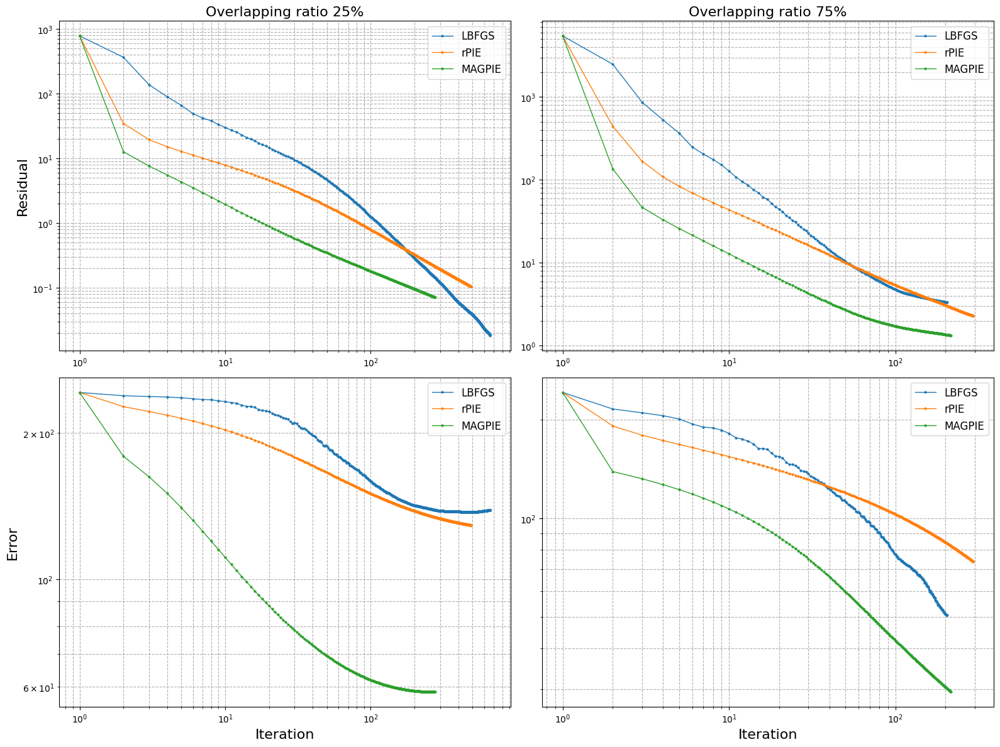

In [20]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# A helper function to plot one subfigure
def plot_subfigure(ax, res_lbfgs, res_rpie, res_mgrpie, noise_level, xlabel = True, ylabel = True):
    # Create x-values from 1 to the length of the residual arrays
    x_lbfgs = np.arange(1, len(res_lbfgs) + 1)
    x_rpie   = np.arange(1, len(res_rpie) + 1)
    x_mgrpie = np.arange(1, len(res_mgrpie) + 1)
    
    # Plot each method's residuals
    ax.plot(x_lbfgs, res_lbfgs, label='LBFGS', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_rpie, res_rpie, label='rPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_mgrpie, res_mgrpie, label='MAGPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    
    # Set plot properties
    if xlabel:
        ax.set_xlabel('Iteration', fontsize=16)
    if ylabel == 1:
        ax.set_ylabel('Residual', fontsize=16)
    if ylabel == 2:
        ax.set_ylabel('Error', fontsize=16)
    if noise_level:
        ax.set_title(f'Overlapping ratio {noise_level}%', fontsize=16)
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(fontsize=12)
    ax.grid(True, which="both", ls="--")

# Assign each subplot to the corresponding noise level
plot_subfigure(axes[0, 0], res_f_LBFGS_o25, res_rPIE_o25, res_MAGPIE_o25,  noise_level=25, xlabel = False, ylabel = 1)
plot_subfigure(axes[0, 1], res_f_LBFGS_o75, res_rPIE_o75, res_MAGPIE_o75, noise_level=75, xlabel = False, ylabel = False)
plot_subfigure(axes[1, 0], errors_LBFGS_o25, errors_rPIE_o25, errors_MAGPIE_o25,  noise_level=None, ylabel = 2)
plot_subfigure(axes[1, 1], errors_LBFGS_o75, errors_rPIE_o75, errors_MAGPIE_o75,  noise_level=None, ylabel = False)
               

plt.tight_layout()
#plt.savefig('metric_3.png', dpi=120, bbox_inches='tight')
plt.show()


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3764779823.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_ground_truth = np.abs(ground_truth)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3764779823.py:15: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3764779823.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/3764779823.py:17: DeprecationWarning: __array_wrap__ must accept context and return

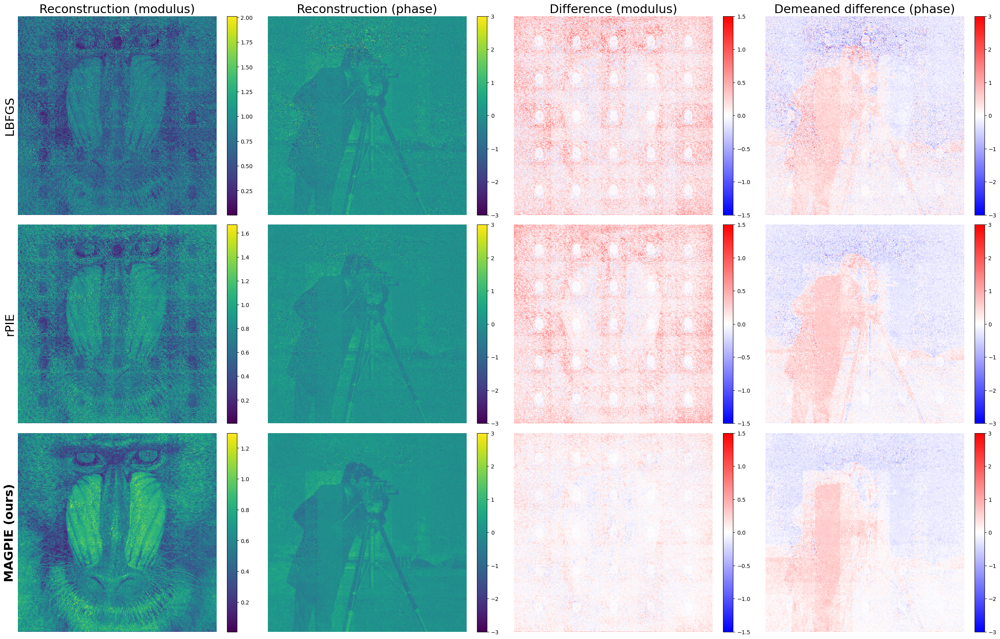

In [22]:
size = object_shape
rPIE_image = z_recon_rPIE_o25
MGrPIE_image = z_recon_MAGPIE_o25
LBFGS_image = zstar_o25.view(np.complex128).reshape(object_shape)
ground_truth = synthetic_object

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis', vmin=-3, vmax=3)
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-1.5, vmax=1.5)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-3, vmax=3)
    fig.colorbar(im3, ax=axes[i, 3])

#plt.savefig('reconstruction_3_25.png', dpi=60, bbox_inches='tight')
plt.show()

/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/187208459.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_ground_truth = np.abs(ground_truth)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/187208459.py:15: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/187208459.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_81095/187208459.py:17: DeprecationWarning: __array_wrap__ must accept context and return_sca

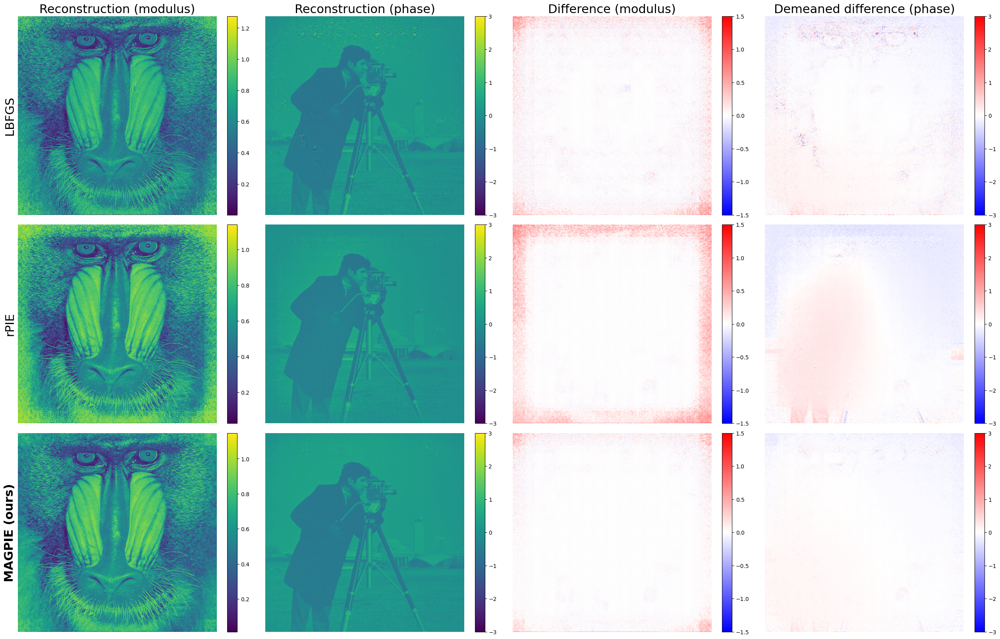

In [23]:
size = object_shape
rPIE_image = z_recon_rPIE_o75
MGrPIE_image = z_recon_MAGPIE_o75
LBFGS_image = zstar_o75.view(np.complex128).reshape(object_shape)
ground_truth = synthetic_object

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis', vmin=-3, vmax=3)
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-1.5, vmax=1.5)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-3, vmax=3)
    fig.colorbar(im3, ax=axes[i, 3])

#plt.savefig('reconstruction_3_75.png', dpi=60, bbox_inches='tight')
plt.show()